In [1]:
from __future__ import annotations

import sys
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Image, display

PROJECT_ROOT = Path.cwd().resolve().parents[0] if Path.cwd().name == 'notebooks' else Path.cwd().resolve()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from scripts.eda_sliding_heat import (
    ANOMALY_NOTES,
    YEARS,
    build_engine,
    build_sliding_frame,
    heat_meter_config,
    fetch_weather_data,
    load_heat_meter_data,
    figure_to_png_bytes,
    print_anomaly_notes,
    render_sliding_plot,
    resolve_feature_columns,
    summarize_sliding_by_year,
)

engine = build_engine()
weather_df = fetch_weather_data(engine).copy()
weather_df['ts'] = pd.to_datetime(weather_df['ts'], utc=True, errors='coerce')
for column in ['Ta', 'Igm']:
    if column in weather_df.columns:
        weather_df[column] = pd.to_numeric(weather_df[column], errors='coerce')

raw_meter_data = {}
resolved_meter_features = {}
for meter_urn, configured_features in heat_meter_config.items():
    try:
        df = load_heat_meter_data(engine, weather_df, meter_urn)
    except Exception as exc:
        print(f'{meter_urn}: 데이터 로드 실패 - {exc}')
        continue
    raw_meter_data[meter_urn] = df
    resolved_meter_features[meter_urn] = resolve_feature_columns(df, configured_features)

YEARS


[2018, 2019, 2020, 2021, 2022, 2023]

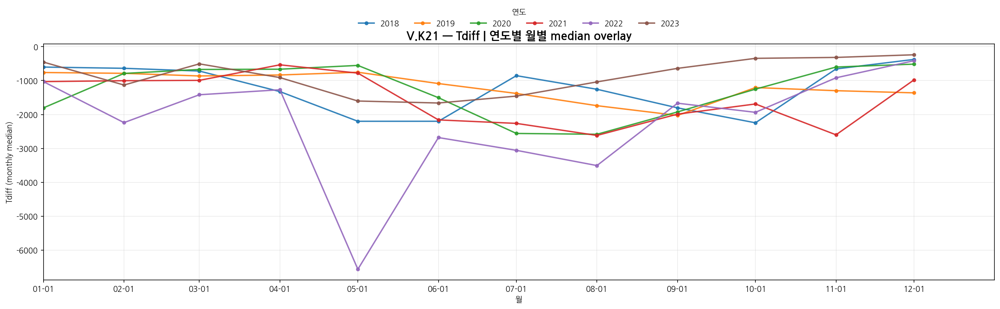

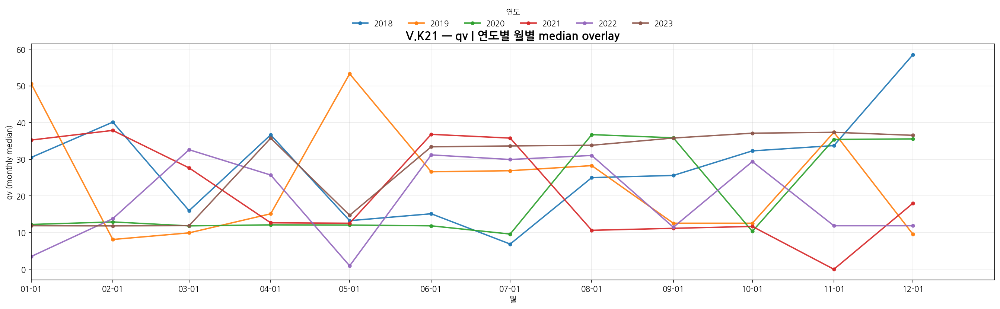

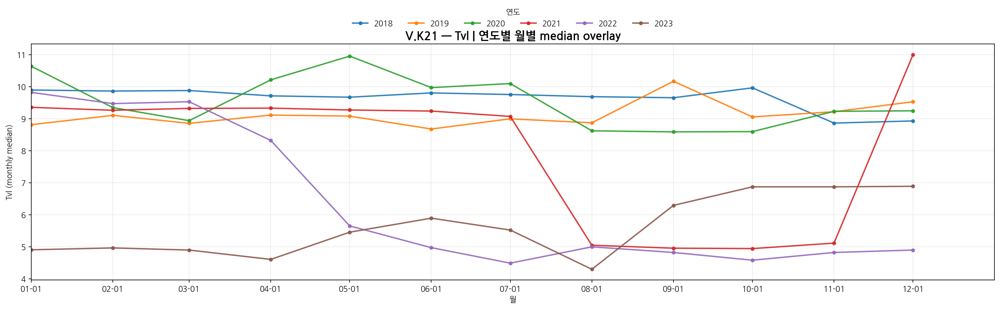

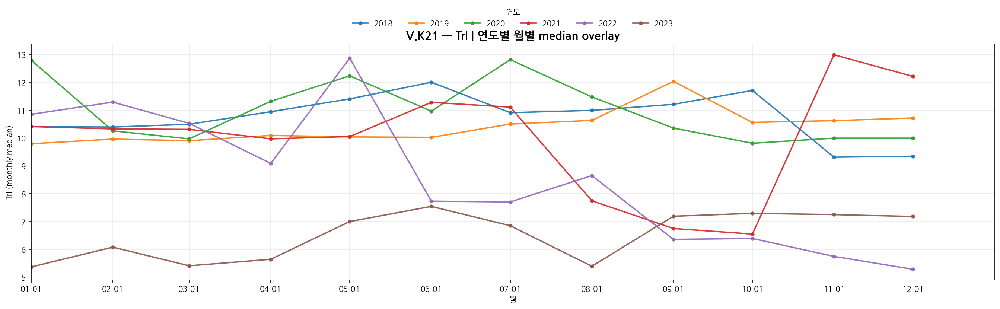

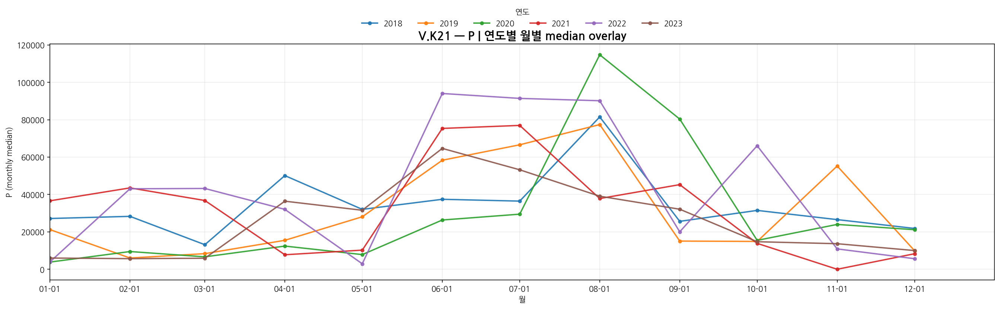

...

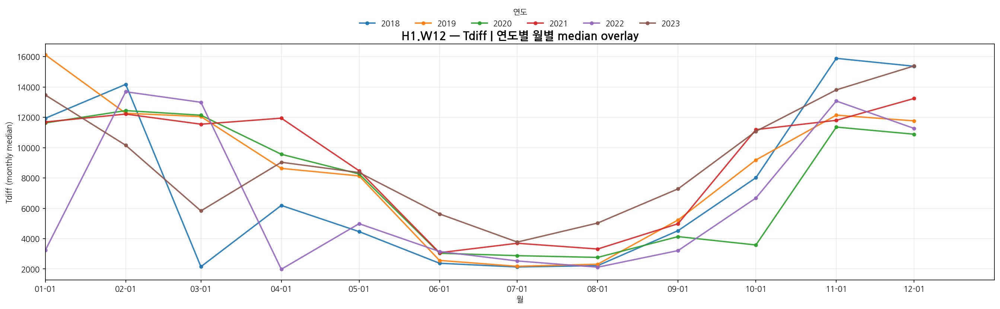

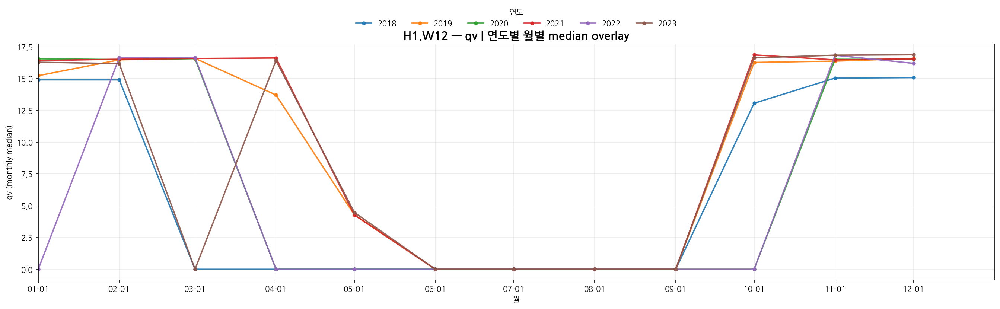

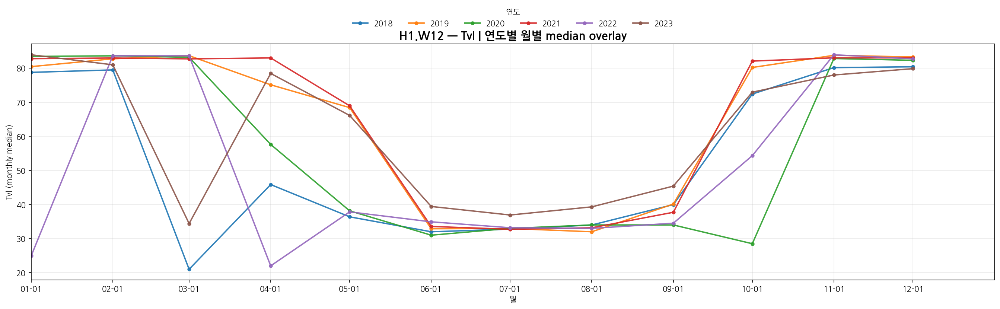

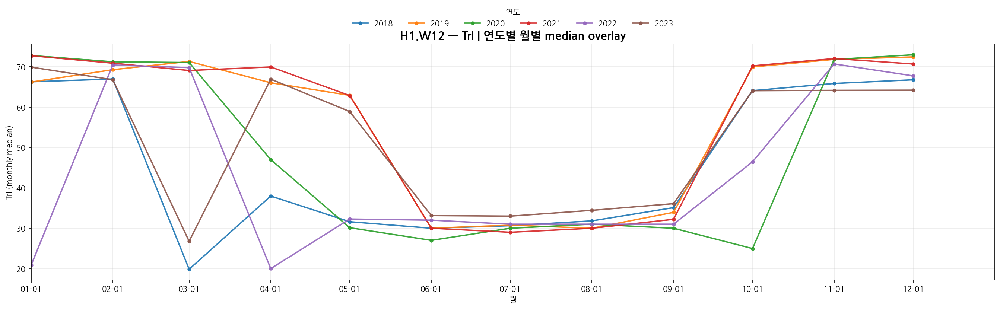

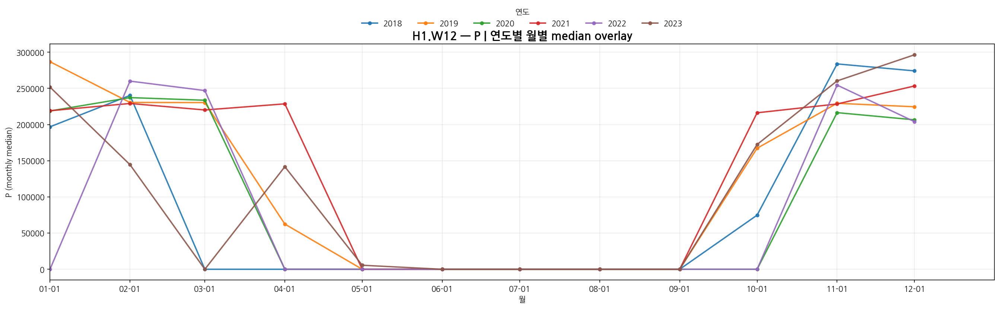

In [2]:
for meter_urn, features in resolved_meter_features.items():
    df = raw_meter_data[meter_urn]
    if not features:
        print(f'{meter_urn}: 유효 컬럼 없음, skip')
        continue

    for feature in features:
        base_sliding_df = build_sliding_frame(df, feature)
        if base_sliding_df.empty or base_sliding_df[feature].dropna().empty:
            print(f'{meter_urn} - {feature}: 유효 데이터 없음, skip')
            continue

        sliding_df = base_sliding_df.copy()
        fig = render_sliding_plot(meter_urn, feature, sliding_df)
        display(Image(data=figure_to_png_bytes(fig)))
        plt.close(fig)


In [3]:
for meter_urn, features in resolved_meter_features.items():
    df = raw_meter_data[meter_urn]
    for feature in features:
        base_sliding_df = build_sliding_frame(df, feature)
        if base_sliding_df.empty or base_sliding_df[feature].dropna().empty:
            continue
        sliding_df = base_sliding_df.copy()
        stats_df = summarize_sliding_by_year(sliding_df, meter_urn, feature)
        if stats_df.empty:
            continue
        print(f'[{meter_urn} — {feature}]')
        display(stats_df[['year', 'mean', 'std', 'min', 'max', 'null_ratio']].set_index('year'))


[V.K21 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1312.792632,1006.563557,-6107.583333,169.754764,0.0
2019,-1219.783587,542.315686,-4007.069561,5124.833333,0.0
2020,-1340.660358,958.801892,-6789.166667,1171.083333,0.0
2021,-1776.426101,1714.014056,-9879.500000,7454.416667,0.0
2022,-2245.331864,1683.555433,-9561.750000,4183.000000,0.0
2023,-1105.542033,1095.872896,-9745.666667,-96.500000,0.0


[V.K21 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,28.531157,15.828973,0.0,85.160000,0.0
2019,27.002392,16.827466,0.0,86.270000,0.0
2020,24.466320,16.749701,0.0,87.257500,0.0
2021,21.374077,15.466152,0.0,75.058333,0.0
2022,20.710686,13.602947,0.0,58.210000,0.0
2023,27.641911,12.095156,0.0,39.833333,0.0


[V.K21 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,9.753657,1.931114,4.266667,27.625,0.376712
2019,9.375467,1.799084,4.464828,26.000,0.000000
2020,10.121696,2.876386,4.725000,37.000,0.000000
2021,8.713560,3.902511,4.000000,31.000,0.000000
2022,6.513997,3.307927,4.000000,32.575,0.000000
2023,6.714460,4.780690,-2.000000,31.000,0.000000


[V.K21 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,11.042456,1.923335,5.000000,28.0,0.502283
2019,10.697218,1.779272,5.838490,26.0,0.000000
2020,11.631307,2.983232,6.075040,37.0,0.000000
2021,10.517950,3.473934,5.416667,31.0,0.000000
2022,8.742306,3.467940,5.116667,32.0,0.000000
2023,7.836184,5.083217,-1.575000,32.0,0.000000


[V.K21 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,47900.809532,46717.815305,0.0,3.093625e+05,0.0
2019,43916.827690,42015.521016,0.0,2.580230e+05,0.0
2020,40594.115789,50267.793321,0.0,3.302733e+05,0.0
2021,39166.188472,41185.403905,0.0,3.650792e+05,0.0
2022,54006.472457,56439.666282,0.0,3.258083e+05,0.0
2023,32747.618807,46319.653120,0.0,1.547998e+06,0.0


[H1.K11 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1121.770290,1494.154900,-5384.166667,1106.333333,0.0
2019,-521.955311,1118.924436,-6151.057469,1294.666667,0.0
2020,-726.019758,1387.371429,-6956.000000,2306.333333,0.0
2021,-690.106779,1755.857127,-8055.916667,10539.583333,0.0
2022,-542.064590,1630.662103,-7735.916667,7877.916667,0.0
2023,-990.749231,1334.756146,-9366.333333,5279.166667,0.0


[H1.K11 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,7.876351,0.938450,0.0,9.461667,0.650685
2019,8.332932,0.786670,0.0,13.241659,0.000000
2020,7.497748,1.467707,0.0,12.670000,0.000000
2021,7.275119,3.712863,0.0,10.838333,0.000000
2022,5.674118,4.841255,0.0,14.898333,0.000000
2023,9.715469,3.230636,0.0,18.200000,0.000000


[H1.K11 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,9.802250,1.673674,4.233333,27.0,0.513699
2019,9.441010,2.012235,4.034243,26.0,0.000000
2020,10.457064,3.192829,4.908333,37.0,0.000000
2021,9.733950,3.937090,4.000000,23.0,0.000000
2022,10.076555,6.517159,4.000000,26.0,0.000000
2023,6.470904,3.496112,-2.000000,24.0,0.000000


[H1.K11 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,10.905994,2.188471,4.366667,27.0,0.445205
2019,9.954781,2.143013,4.528655,26.0,0.000000
2020,11.181974,3.291719,5.258333,36.0,0.000000
2021,10.418638,3.818974,4.333333,27.0,0.000000
2022,10.607926,5.961382,4.000000,28.0,0.000000
2023,7.473884,4.219710,-1.591667,28.0,0.000000


[H1.K11 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,10234.174099,11630.704780,0.000000e+00,48263.333333,0.650685
2019,6100.039047,8430.856792,0.000000e+00,55218.171675,0.000000
2020,5882.327125,8523.857336,-1.894781e-15,45558.333333,0.000000
2021,7636.887101,10129.348501,0.000000e+00,47620.000000,0.000000
2022,7027.173189,12426.178774,0.000000e+00,64010.000000,0.000000
2023,9143.795391,15105.042313,0.000000e+00,440755.000000,0.000000


[H1.K12 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1488.208837,2085.919125,-8893.333333,16278.500000,0.0
2019,-163.386312,5025.655521,-15152.548656,17580.357186,0.0
2020,102.848273,5051.315339,-15557.833333,17130.666667,0.0
2021,-2797.273189,4657.861853,-15597.166667,13860.166667,0.0
2022,-1186.207136,3378.603972,-14753.666667,15941.750000,0.0
2023,266.651106,1250.524875,-5405.000000,3689.916667,0.0


[H1.K12 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,6.267714,8.988042,0.0,27.551667,0.650685
2019,7.451313,10.868876,0.0,27.993893,0.000000
2020,6.461672,10.826091,0.0,27.585588,0.000000
2021,8.919969,11.242232,0.0,27.890000,0.000000
2022,7.029783,8.098133,0.0,20.947500,0.000000
2023,0.000056,0.002312,0.0,0.140000,0.000000


[H1.K12 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,10.217908,1.874554,4.216667,24.725000,0.616438
2019,11.981977,4.533182,4.000000,28.000000,0.000000
2020,13.463385,5.163040,5.116679,37.000000,0.000000
2021,11.006875,4.924844,4.000000,26.000000,0.000000
2022,11.604227,6.454756,4.000000,29.158333,0.000000
2023,18.974075,3.753519,8.900000,28.000000,0.000000


[H1.K12 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,11.660778,1.833652,5.000000,27.0,0.650685
2019,12.127196,2.843284,5.000000,25.7,0.000000
2020,13.396593,3.846526,6.200000,37.3,0.000000
2021,13.762748,4.721348,5.700000,29.0,0.000000
2022,12.797969,4.808093,6.141667,30.0,0.000000
2023,18.712467,4.300098,7.466667,30.0,0.000000


[H1.K12 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,14267.062946,25612.151782,0.0,109635.833333,0.650685
2019,17905.818147,28356.107730,0.0,114834.160747,0.000000
2020,14592.082296,28407.954213,0.0,102363.333333,0.000000
2021,17985.362754,24220.105212,0.0,98345.000000,0.000000
2022,22127.114470,26373.649857,0.0,89161.666667,0.000000
2023,0.048902,4.436528,0.0,415.000000,0.000000


[H1.K14 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1744.191006,2452.000350,-12152.166667,1893.791667,0.0
2019,-1042.307454,1711.340970,-13511.604877,2236.593837,0.0
2020,-1012.730373,1295.390702,-10917.874592,1974.712170,0.0
2021,-729.494046,1188.392368,-11182.583333,2307.750000,0.0
2022,-1102.541348,1538.486184,-9733.833333,8325.000000,0.0
2023,-1153.804583,1611.930418,-13808.250000,177.916667,0.0


[H1.K14 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,14.127684,13.719742,0.0,51.315556,0.650685
2019,14.371992,17.875630,0.0,51.308230,0.000000
2020,7.805288,12.327811,0.0,51.241667,0.000000
2021,3.058463,8.373210,0.0,52.326667,0.000000
2022,6.409717,10.233596,0.0,30.275000,0.000000
2023,16.488705,10.761885,0.0,25.570000,0.000000


[H1.K14 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,10.358634,1.782157,5.000000,28.00,0.650685
2019,10.815722,3.145654,4.465729,26.95,0.000000
2020,14.497111,4.978729,5.308333,33.00,0.000000
2021,16.360904,4.627413,4.833333,27.00,0.000000
2022,14.066611,6.010044,4.516667,29.00,0.000000
2023,9.598083,6.036351,-1.541667,25.00,0.000000


[H1.K14 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,12.134211,3.040801,5.111111,28.000000,0.057078
2019,11.853784,3.272014,5.383333,26.800006,0.000000
2020,15.509876,5.099431,7.683333,34.000000,0.000000
2021,17.086088,4.429461,5.300000,28.000000,0.000000
2022,15.177444,5.360669,5.383333,29.000000,0.000000
2023,10.758670,6.215855,-1.475000,29.000000,0.000000


[H1.K14 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,20713.048991,29266.716070,0.0,159651.666667,0.6621
2019,16837.343744,24400.732580,0.0,173100.396394,0.0000
2020,11813.526174,24886.075204,0.0,239229.166667,0.0000
2021,6500.761979,21530.576965,0.0,217691.666667,0.0000
2022,16524.224601,34778.448543,0.0,245635.833333,0.0000
2023,16350.384628,26026.173516,0.0,725101.666667,0.0000


[H1.K15 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1383.087928,7435.552998,-18962.583333,16914.500000,0.0
2019,-8414.394348,2551.411959,-19064.000000,4122.166667,0.0
2020,-7657.187814,2686.919105,-17913.416667,9739.000000,0.0
2021,-6275.318982,4444.253164,-20631.000000,9789.583333,0.0
2022,-5441.241534,5881.326470,-20344.416667,7399.666667,0.0
2023,-9754.750066,3445.563940,-22126.000000,2508.250000,0.0


[H1.K15 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,2.401304,2.905233,-9.251859e-19,8.714208,0.650685
2019,0.385789,1.003251,0.000000e+00,7.347333,0.000000
2020,0.580544,1.239409,0.000000e+00,7.712498,0.000000
2021,1.116415,1.997868,0.000000e+00,8.173333,0.000000
2022,0.832743,1.751673,0.000000e+00,8.173333,0.000000
2023,0.574718,4.457549,0.000000e+00,122.578584,0.000000


[H1.K15 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,14.056432,4.471617,-43.758333,26.000000,0.011416
2019,12.288318,2.203657,4.116667,25.566667,0.000000
2020,12.936243,3.202113,5.050000,37.000000,0.000000
2021,12.684573,5.830799,4.550000,30.000000,0.000000
2022,14.530963,8.702992,4.316667,31.000000,0.000000
2023,9.554430,3.716639,-0.125000,26.000000,0.000000


[H1.K15 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,15.423748,4.883120,-151.808333,26.000000,0.0
2019,20.724643,1.713291,11.391667,26.283333,0.0
2020,20.582769,2.300862,11.966667,36.000000,0.0
2021,18.960811,3.727326,7.650000,42.283333,0.0
2022,19.974331,4.182828,6.141667,31.000000,0.0
2023,19.299857,2.385859,5.783333,25.225000,0.0


[H1.K15 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,8293.544568,12322.787257,0.0,46798.000000,0.650685
2019,3148.632374,7290.842390,0.0,40295.416667,0.000000
2020,3792.846356,7349.936767,0.0,34871.333333,0.000000
2021,5287.110932,8699.816596,0.0,34594.000000,0.000000
2022,5286.346418,10079.472602,0.0,46682.517760,0.000000
2023,3689.131023,8953.392057,0.0,189893.750000,0.000000


[H1.K16 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-1045.581466,209.749661,-1647.666667,-455.166667,0.0
2019,-1215.421349,336.650522,-2905.363718,5481.666667,0.0
2020,-1494.991212,679.785921,-7195.243113,13347.166667,0.0
2021,-3275.147273,3115.896546,-24456.083333,7665.166667,0.0
2022,-6628.295517,3125.911469,-14198.833333,253.916667,0.0
2023,-6913.793994,1167.719349,-15472.333333,-1886.500000,0.0


[H1.K16 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,3.422803,0.130996,3.083778,3.656222,0.0
2019,3.510482,0.154281,0.000000,3.873636,0.0
2020,2.994365,0.508017,0.000000,3.732391,0.0
2021,1.896445,0.993427,0.000000,3.351333,0.0
2022,0.943296,0.920798,0.000000,3.734000,0.0
2023,0.478424,0.102106,0.013030,0.999833,0.0


[H1.K16 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,10.042787,3.767703,4.266667,23.0,0.0
2019,9.346213,2.014711,3.950007,26.0,0.0
2020,10.365702,3.229240,4.591667,37.0,0.0
2021,8.723588,3.818553,4.400000,31.0,0.0
2022,6.582169,3.278044,4.000000,32.0,0.0
2023,6.852912,4.696440,-1.900000,31.0,0.0


[H1.K16 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,11.094085,3.564776,5.612500,24.000000,0.0
2019,10.552889,1.950392,5.204282,26.000000,0.0
2020,11.896313,2.913499,5.733333,37.000000,0.0
2021,12.001073,3.190040,7.641667,34.525000,0.0
2022,13.230881,2.856604,6.175000,32.741667,0.0
2023,13.790139,3.795796,4.541667,33.000000,0.0


[H1.K16 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,4135.881502,803.673035,1770.750000,6483.666667,0.0
2019,4936.121288,1363.260522,0.000000,10748.813111,0.0
2020,5095.337693,1397.633392,0.000000,13323.000000,0.0
2021,4953.263488,1951.588612,0.000000,12582.500000,0.0
2022,4490.460984,1146.603498,0.000000,14223.500000,0.0
2023,4334.392057,8705.857727,346.833333,274459.916667,0.0


[H2.K21 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,-362.546470,442.484826,-3285.344156,1344.500000,0.0
2019,-427.963039,425.832868,-3262.934381,1011.000000,0.0
2020,-327.067337,467.767895,-4522.697222,1348.012808,0.0
2021,-398.471203,579.422913,-6850.853591,1119.972072,0.0
2022,-394.654771,546.227194,-4099.666667,2929.000000,0.0
2023,-390.884784,570.915051,-5781.000000,1416.833333,0.0


[H2.K21 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,19.886571,14.622144,0.0,42.817604,0.650685
2019,14.977704,15.912168,0.0,43.276399,0.000000
2020,11.177756,14.787826,0.0,44.981418,0.000000
2021,3.955701,9.871136,0.0,33.629451,0.000000
2022,10.691974,15.006685,0.0,50.477500,0.000000
2023,10.883843,14.099304,0.0,41.948333,0.000000


[H2.K21 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,12.873551,3.888199,4.350932,27.000000,0.650685
2019,13.776803,5.161133,4.775000,25.488298,0.000000
2020,16.957705,5.425575,8.000000,30.000000,0.000000
2021,18.789196,4.947202,4.958438,29.000000,0.000000
2022,15.940636,6.000480,5.341667,30.000000,0.000000
2023,13.123852,6.200739,4.683333,26.683333,0.000000


[H2.K21 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,13.256788,3.828833,5.000000,27.000000,0.650685
2019,14.486726,5.064169,5.077244,26.477749,0.000000
2020,17.300368,5.316939,8.083435,30.000000,0.000000
2021,19.210542,4.759605,5.033426,29.733054,0.000000
2022,16.333825,5.848527,5.983333,30.000000,0.000000
2023,13.517550,6.022030,5.000000,26.183333,0.000000


[H2.K21 — P]

,mean,std,min,max,null_ratio
year,,,,,
2018,12414.939343,19798.980703,0.0,108617.891166,0.650685
2019,9978.538898,16155.408350,0.0,127263.017483,0.000000
2020,6841.282202,15098.745187,0.0,127931.747268,0.000000
2021,3185.638753,11133.562193,0.0,101201.350182,0.000000
2022,9053.614126,20500.354985,0.0,116901.666667,0.000000
2023,8483.172849,15591.014041,0.0,127011.445179,0.000000


[H1.W11 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,4293.134459,3576.951951,-502.083333,34912.916667,0.0
2019,4341.971850,3193.144331,-378.116710,13892.666667,0.0
2020,4090.916921,2778.732424,-350.500000,13579.083333,0.0
2021,4726.666217,3602.555219,-325.833333,24202.666667,0.0
2022,4084.455447,2819.789553,-481.166667,13392.166667,0.0
2023,8251.208152,7973.501766,-7851.583333,38713.416667,0.0


[H1.W11 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,43.918187,6.721773,0.000000,61.041667,0.0
2019,52.615371,4.526103,14.875642,64.446667,0.0
2020,50.539756,6.498613,11.171039,60.840708,0.0
2021,53.902244,4.102916,6.074942,61.860000,0.0
2022,52.444818,5.053561,3.251667,66.158333,0.0
2023,30.333593,18.132515,0.000000,60.155000,0.0


[H1.W11 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,69.769123,4.186328,46.000000,78.600000,0.0
2019,74.383823,4.208636,63.564238,84.074896,0.0
2020,75.070883,4.364547,61.933333,84.673240,0.0
2021,75.626720,3.975468,64.791667,84.950000,0.0
2022,73.363430,4.984891,19.425000,84.583333,0.0
2023,64.982567,15.183791,19.000000,88.758333,0.0


[H1.W11 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,65.482932,3.636676,35.475000,75.391667,0.0
2019,70.042674,3.682699,58.175000,79.475000,0.0
2020,70.983019,3.523317,57.708333,79.566667,0.0
2021,70.896236,3.426803,56.025000,79.791667,0.0
2022,69.265846,4.138872,18.908333,80.066667,0.0
2023,56.726676,11.798607,19.000000,83.191667,0.0


[H1.W11 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,226642.232174,178591.465246,0.0,7.895700e+05,0.0
2019,272030.652963,197100.160844,0.0,9.336900e+05,0.0
2020,241902.352826,161484.363746,0.0,8.728000e+05,0.0
2021,293177.327975,212198.496806,0.0,1.150232e+06,0.0
2022,247073.580949,164751.190313,0.0,9.358483e+05,0.0
2023,194848.771146,174020.840076,0.0,7.657783e+05,0.0


[H1.W12 — Tdiff]


,mean,std,min,max,null_ratio
year,,,,,
2018,7331.326304,5604.314311,-936.166667,20428.583333,0.0
2019,8225.116597,5031.696733,-356.766783,17199.583333,0.0
2020,7644.564801,4736.803683,-561.000000,24550.916667,0.0
2021,8295.971770,4919.845699,-356.266393,17005.083333,0.0
2022,7051.140289,5160.723892,-531.250000,25034.833333,0.0
2023,9072.630488,5123.574210,-5205.000000,31554.833333,0.0


[H1.W12 — qv]


,mean,std,min,max,null_ratio
year,,,,,
2018,6.643009,7.432224,0.0,16.870000,0.0
2019,9.200827,8.066625,0.0,17.714997,0.0
2020,8.257585,8.284307,0.0,17.695387,0.0
2021,9.715370,8.189698,0.0,17.738750,0.0
2022,6.466722,8.113029,0.0,17.800500,0.0
2023,8.558568,7.940030,0.0,17.897917,0.0


[H1.W12 — Tvl]


,mean,std,min,max,null_ratio
year,,,,,
2018,54.785256,23.004369,5.000000,87.0,0.0
2019,62.957672,22.678776,20.683333,87.0,0.0
2020,58.833527,24.346028,18.641667,87.0,0.0
2021,63.825501,22.608289,20.000000,87.0,0.0
2022,52.903380,25.801788,11.000000,87.0,0.0
2023,60.477620,21.209149,11.000000,87.0,0.0


[H1.W12 — Trl]


,mean,std,min,max,null_ratio
year,,,,,
2018,47.438686,18.782572,3.000000,81.454167,0.0
2019,54.715334,19.046638,16.183333,78.908333,0.0
2020,51.182460,21.313515,17.000000,78.733333,0.0
2021,55.533348,19.473785,16.000000,79.050000,0.0
2022,45.850544,21.532496,9.233333,78.733333,0.0
2023,51.372486,17.820118,10.000000,80.633333,0.0


[H1.W12 — P]


,mean,std,min,max,null_ratio
year,,,,,
2018,90848.345823,118662.101161,0.0,355942.531526,0.0
2019,119614.039147,120417.106361,0.0,304717.503157,0.0
2020,99370.155839,115910.840871,0.0,293762.516147,0.0
2021,120632.188341,122444.037158,0.0,317018.833333,0.0
2022,90180.077987,122130.758500,0.0,323631.500000,0.0
2023,115958.366915,126583.980253,0.0,316206.333333,0.0


In [4]:
print_anomaly_notes()


[확인 필요 구간]
V.K21 qv:    2022 말~2023 초 rolling std 급감, 고착 의심
H1.K12 P:    2023년 장기 0 구간, 미가동/이상 여부 확인 필요
H1.K15 Tdiff: 2018 봄 장기 양수 구간, 부호/매핑 이상 의심
H2.K21 Tdiff: 2021.11.15~12.10 게이트웨이 장애 구간 확인
H1.W11 Tdiff: 2023년 운전 조건 변화(난방 현대화) 확인
H1.W12 qv:   여름철 qv≈0 구간, CHP 미가동 정상 가능성 검토
